Project 2 Code
----

Genetic Algorithm - Before Improvements

In [141]:
# Genetic Algorithm to Maximize f(x, y) = sin(sqrt(x^2 + y^2)) * (x + y)
# Boundaries: -6 <= x, y <= 6
# Population Size: 8
# Generations: 1024
# Without improvements (no elitism, no adaptive mutation rate)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib

# Set random seed for reproducibility
np.random.seed(42)

# Increase the embed limit to allow larger animations (set to 50 MB)
matplotlib.rcParams['animation.embed_limit'] = 50  # in MB

# Function to maximize
def fitness_function(individual):
    x, y = individual
    return np.sin(np.sqrt(x**2 + y**2)) * (x + y)

# Manually declare initial population
initial_population = np.array([
    [-5.0, -5.0],
    [5.0, -5.0],
    [-5.0, 5.0],
    [5.0, 5.0],
    [0.0, 0.0],
    [2.0, -3.0],
    [-3.0, 2.0],
    [1.0, 1.0]
])

# Selection (Roulette Wheel Selection with Non-Negative Fitness Adjustment)
def selection(population, fitness_scores):
    # Shift fitness scores to be non-negative
    min_fitness = np.min(fitness_scores)
    if min_fitness < 0:
        fitness_scores = fitness_scores - min_fitness
    # Avoid division by zero
    total_fitness = np.sum(fitness_scores)
    if total_fitness == 0:
        # If all fitness scores are zero, select randomly
        selection_probs = np.ones(len(fitness_scores)) / len(fitness_scores)
    else:
        selection_probs = fitness_scores / total_fitness
    indices = np.random.choice(len(population), size=len(population), p=selection_probs)
    return population[indices]

# Crossover (Uniform Crossover)
def crossover(parents):
    offspring = np.empty_like(parents)
    for i in range(0, len(parents), 2):
        if i+1 < len(parents):
            parent1, parent2 = parents[i], parents[i+1]
            mask = np.random.rand(2) > 0.5
            offspring[i] = np.where(mask, parent1, parent2)
            offspring[i+1] = np.where(mask, parent2, parent1)
        else:
            offspring[i] = parents[i]
    return offspring

# Mutation (Gaussian Mutation with Fixed Rate)
def mutation(offspring, mutation_rate=0.1):
    for individual in offspring:
        if np.random.rand() < mutation_rate:
            mutation_value = np.random.normal(0, 0.5, 2)
            individual += mutation_value
            individual[:] = np.clip(individual, -6, 6)
    return offspring

# Genetic Algorithm without improvements
def genetic_algorithm(pop_size, max_generations, initial_population):
    population = initial_population.copy()
    best_fitness_history = []
    best_individual_history = []

    for generation in range(max_generations):
        fitness_scores = np.array([fitness_function(ind) for ind in population])
        best_fitness = np.max(fitness_scores)
        best_individual = population[np.argmax(fitness_scores)]
        best_fitness_history.append(best_fitness)
        best_individual_history.append(best_individual.copy())

        # Selection
        selected_parents = selection(population, fitness_scores)

        # Crossover
        offspring = crossover(selected_parents)

        # Mutation
        offspring = mutation(offspring)

        # Create new population
        population = offspring

    return best_fitness_history, best_individual_history

# Run the Genetic Algorithm without improvements
pop_size = 8
max_generations = 1024
best_fitness_history_no_imp, best_individual_history_no_imp = genetic_algorithm(pop_size, max_generations, initial_population)


Outputs - Before Improvements

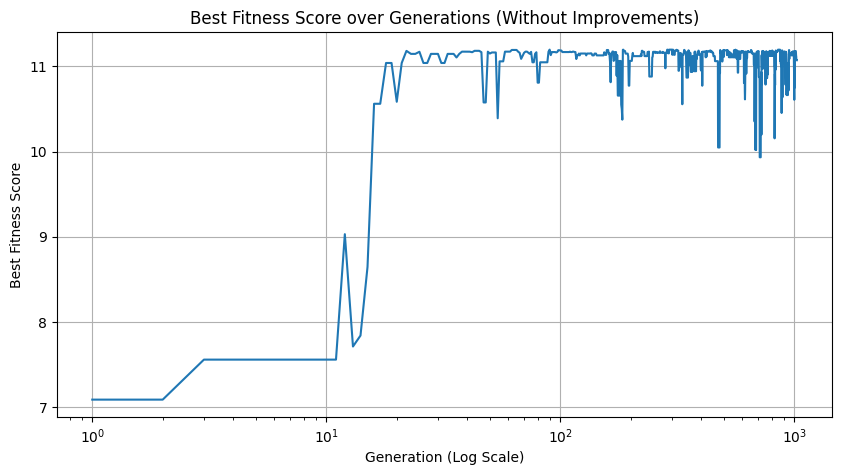

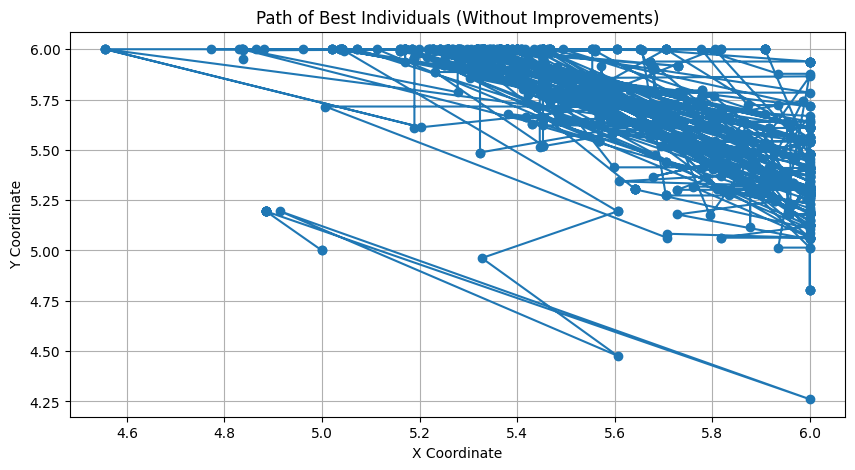

In [142]:
# Plotting Fitness over Generations for Genetic Algorithm without improvements
plt.figure(figsize=(10, 5))
plt.plot(np.arange(1, max_generations + 1), best_fitness_history_no_imp)
plt.xscale('log')
plt.xlabel('Generation (Log Scale)')
plt.ylabel('Best Fitness Score')
plt.title('Best Fitness Score over Generations (Without Improvements)')
plt.grid(True)
plt.show()

# Plotting Path of Best Individuals for Genetic Algorithm without improvements
best_individuals_no_imp = np.array(best_individual_history_no_imp)
x_coords_no_imp = best_individuals_no_imp[:, 0]
y_coords_no_imp = best_individuals_no_imp[:, 1]

plt.figure(figsize=(10, 5))
plt.plot(x_coords_no_imp, y_coords_no_imp, marker='o')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Path of Best Individuals (Without Improvements)')
plt.grid(True)
plt.show()

# Animation of Best Individual Movement over Generations (Without Improvements)

# Reduce the number of frames if necessary to prevent large file sizes
frame_skip = max(1, len(x_coords_no_imp) // 200)  # Limit to 200 frames
frames_to_use = range(0, len(x_coords_no_imp), frame_skip)

fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-6, 6)
ax.set_ylim(-6, 6)
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_title('Animation of Best Individual Movement Over Generations (Without Improvements)')
line, = ax.plot([], [], 'ro-')

def animate_no_imp(i):
    idx = frames_to_use[i]
    line.set_data(x_coords_no_imp[:idx+1], y_coords_no_imp[:idx+1])
    return line,

ani_no_imp = FuncAnimation(fig, animate_no_imp, frames=len(frames_to_use), interval=50, blit=True)
plt.close()
HTML(ani_no_imp.to_jshtml())


Genetic Algorithm with Improvements


In [143]:
# Genetic Algorithm with improvements (elitism and adaptive mutation rate)

def genetic_algorithm_improved(pop_size, max_generations, initial_population):
    population = initial_population.copy()
    best_fitness_history = []
    best_individual_history = []

    for generation in range(max_generations):
        fitness_scores = np.array([fitness_function(ind) for ind in population])
        best_fitness = np.max(fitness_scores)
        best_individual = population[np.argmax(fitness_scores)]
        best_fitness_history.append(best_fitness)
        best_individual_history.append(best_individual.copy())

        # Elitism: Keep the best individual
        new_population = [best_individual]

        # Selection
        selected_parents = selection(population, fitness_scores)

        # Crossover
        offspring = crossover(selected_parents)

        # Mutation with adaptive mutation rate
        mutation_rate = 0.1 * (1 - (generation / max_generations))  # Adaptive mutation rate
        offspring = mutation(offspring, mutation_rate)

        # Create new population
        population = np.vstack((new_population, offspring[:-1]))

    return best_fitness_history, best_individual_history

# Run the Genetic Algorithm with improvements
best_fitness_history_imp, best_individual_history_imp = genetic_algorithm_improved(pop_size, max_generations, initial_population)


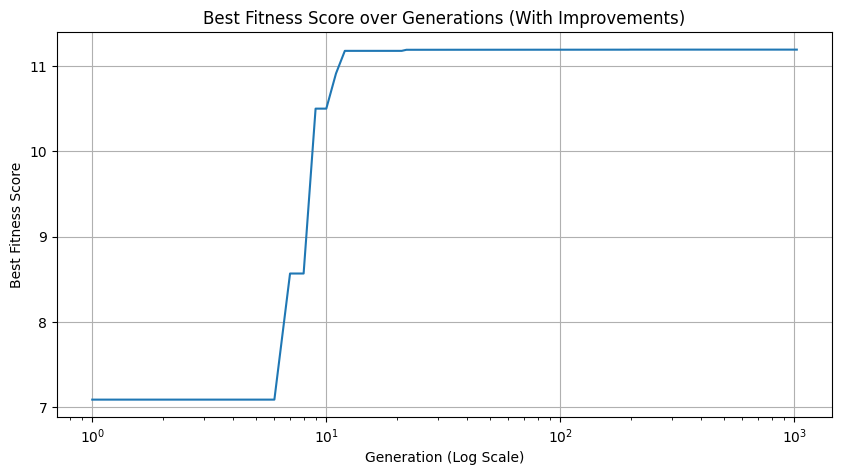

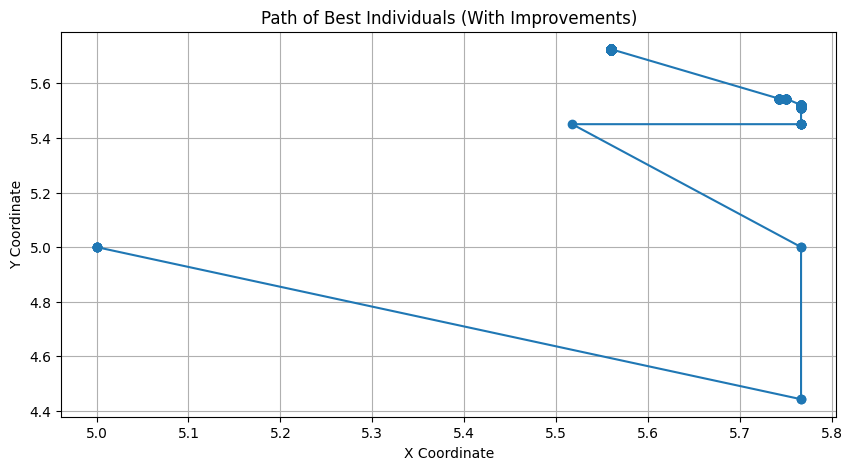

In [144]:
# Plotting Fitness over Generations for Genetic Algorithm with improvements
plt.figure(figsize=(10, 5))
plt.plot(np.arange(1, max_generations + 1), best_fitness_history_imp)
plt.xscale('log')
plt.xlabel('Generation (Log Scale)')
plt.ylabel('Best Fitness Score')
plt.title('Best Fitness Score over Generations (With Improvements)')
plt.grid(True)
plt.show()

# Plotting Path of Best Individuals for Genetic Algorithm with improvements
best_individuals_imp = np.array(best_individual_history_imp)
x_coords_imp = best_individuals_imp[:, 0]
y_coords_imp = best_individuals_imp[:, 1]

plt.figure(figsize=(10, 5))
plt.plot(x_coords_imp, y_coords_imp, marker='o')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Path of Best Individuals (With Improvements)')
plt.grid(True)
plt.show()

# Animation of Best Individual Movement over Generations (With Improvements)

# Reduce the number of frames if necessary to prevent large file sizes
frame_skip = max(1, len(x_coords_imp) // 200)  # Limit to 200 frames
frames_to_use = range(0, len(x_coords_imp), frame_skip)

fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-6, 6)
ax.set_ylim(-6, 6)
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_title('Animation of Best Individual Movement Over Generations (With Improvements)')
line, = ax.plot([], [], 'ro-')

def animate_imp(i):
    idx = frames_to_use[i]
    line.set_data(x_coords_imp[:idx+1], y_coords_imp[:idx+1])
    return line,

ani_imp = FuncAnimation(fig, animate_imp, frames=len(frames_to_use), interval=50, blit=True)
plt.close()
HTML(ani_imp.to_jshtml())


# Methodology and Explanations

## Introduction

I implemented a genetic algorithm to maximize the function:

$$
f(x, y) = \sin\left(\sqrt{x^2 + y^2}\right) \times (x + y)
$$

within the boundaries $-6 \leq x, y \leq 6$. The algorithm runs for 1024 generations with a population size of 8.

I conducted two runs of the genetic algorithm:

1. **Without Improvements**: Standard genetic algorithm without elitism or adaptive mutation rate.
2. **With Improvements**: Genetic algorithm incorporating elitism and adaptive mutation rate.

The initial population is manually declared and identical for both runs to allow for a direct comparison of the results.

## Representation of Individuals

Each individual is represented as a NumPy array `[x, y]`, where `x` and `y` are real numbers within the specified boundaries.

## Fitness Function

The fitness function evaluates each individual based on the target function to maximize:

$$
f(x, y) = \sin\left(\sqrt{x^2 + y^2}\right) \times (x + y)
$$

## Genetic Operators

### Selection Process

**Method Used:** Roulette Wheel Selection with Non-Negative Fitness Adjustment

- **Stochastic Nature:** Individuals are selected probabilistically based on their fitness scores.
- **Implementation Adjustments:**
  - **Non-Negative Fitness Scores:** Since the fitness function can produce negative values, I adjust the fitness scores by subtracting the minimum fitness score if it's negative. This ensures all fitness scores are non-negative.
  - **Avoiding Division by Zero:** If all adjusted fitness scores sum to zero, I assign equal selection probabilities to all individuals to prevent division by zero errors.

### Crossover Process

**Method Used:** Uniform Crossover

- **Stochastic Nature:** For each gene (`x` or `y`), genes are swapped between parents based on a random mask.
- **Implementation:** Offspring are created by randomly selecting genes from either parent using a mask generated by `np.random.rand(2) > 0.5`.

### Mutation Process (Without Improvements)

**Method Used:** Gaussian Mutation with Fixed Mutation Rate

- **Stochastic Nature:** Each individual has a fixed chance to mutate.
- **Implementation:** Mutation is applied with a fixed rate (0.1), adding Gaussian noise to genes using `np.random.normal(0, 0.5, 2)`.

### Mutation Process (With Improvements)

**Method Used:** Gaussian Mutation with Adaptive Mutation Rate

- **Stochastic Nature:** Mutation rate decreases over generations.
- **Implementation:** Mutation rate starts at 0.1 and decreases linearly to 0 over the generations:

  ```python
  mutation_rate = 0.1 * (1 - (generation / max_generations))


# Improvements Implemented

## 1. Elitism
  The best individual from the current generation is directly passed to the next generation without alteration.

  - Preserves the best solutions.
  - Prevents loss of top performers due to genetic operations.
  - Potentially improves convergence.

## 2. Adaptive Mutation Rate
  Mutation rate decreases linearly over generations from an initial rate of 0.1 to 0.

  - Encourages exploration in early generations.
  - Promotes exploitation in later generations.
  - Enhances the balance between exploration and exploitation.

---

# Results

## **Fitness Over Generations**

### *Without Improvements*
  The fitness score shows fluctuations and slower convergence.
  Indicates less efficient optimization.
### *With Improvements*
  The fitness score improves more steadily and reaches higher values.
  Demonstrates more effective convergence.

## **Path of Best Individuals**

### *Without Improvements*
  The path shows more erratic movements.
  Lack of elitism and constant mutation rate.

### *With Improvements*
  The path demonstrates more focused exploration.
  Converges towards optimal areas more efficiently.

---

# Effectiveness of Improvements

- **Elitism:**  
  - Ensures that the best solution is retained in each generation.
  - Leads to consistent improvement in fitness scores.
  
- **Adaptive Mutation Rate:**  
  - Allows the algorithm to explore the search space widely in the early stages.
  - Fine-tunes solutions in the later stages.
  - Improves convergence speed and solution quality.

---

# Conclusion
Implementation of elitism and adaptive mutation rate significantly improves the genetic algorithm's performance. Enhancements lead to faster convergence, higher fitness scores, and more efficient exploration of the search space.
  
The genetic algorithm with improvements is more effective in optimizing the function within the given constraints compared to the run without improvements.

---

# Potential Further Improvements

- **Increase Population Size:**  
  - A larger population could introduce more diversity.
  - Potentially enhances the search process.
  
- **Alternative Selection Methods:**  
  - Implement methods like tournament selection or rank-based selection.
  - Could improve selection pressure and diversity.
  
- **Advanced Crossover Techniques:**  
  - Utilize techniques such as arithmetic crossover or heuristic crossover.
  - Might produce better offspring by combining parental traits more effectively.
